In [1]:
import pandas as pd
import numpy as np
import sqlite3
from tqdm import tqdm
import pickle
from pandarallel import pandarallel
from time import time
import matplotlib.pyplot as plt
import seaborn as sns
from goatools.obo_parser import GODag
from goatools.mapslim import mapslim
from goatools.gosubdag.gosubdag import GoSubDag
import requests
import os
import re
import networkx as nx


from vocabulary_functions import load_tokenizers
from go_functions import (
    create_unit_documents, create_go_labels, create_bertopic_model, 
    create_graph_aware_bertopic_model, split_data, GOHierarchyComparator,
    compare_hierarchies, compare_tokenization_methods_hierarchical, visualize_comparison_results
)

In [2]:
pandarallel.initialize(nb_workers=20, progress_bar=True)

INFO: Pandarallel will run on 20 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


In [3]:
# --- GO DAG and GO Slim Setup ---
ob_url = "http://purl.obolibrary.org/obo/go/go-basic.obo"
obo_path = "go-basic.obo"
if not os.path.exists(obo_path):
    with open(obo_path, "w") as f:
        f.write(requests.get(obo_url).text)
go_dag = GODag(obo_path)

goslim_url = "http://current.geneontology.org/ontology/subsets/goslim_generic.obo"
goslim_path = "goslim_generic.obo"
if not os.path.exists(goslim_path):
    with open(goslim_path, "w") as f:
        f.write(requests.get(goslim_url).text)
goslim_dag = GODag(goslim_path)
goslim_terms = set(goslim_dag.keys())
go_subdag_slim = GoSubDag(goslim_terms, go_dag)
goslim_id2name = {go_id: go_dag[go_id].name for go_id in goslim_terms}
goslim_name2id = {go_dag[go_id].name: go_id for go_id in goslim_terms}

go-basic.obo: fmt(1.2) rel(2025-03-16) 43,544 Terms
goslim_generic.obo: fmt(1.2) rel(go/2025-03-16/subsets/goslim_generic.owl) 206 Terms
 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


In [4]:
# --- Tokenizer and Vocabulary Configuration ---
vocab_sizes = [1600, 3200, 6400, 12800, 25600]
# vocab_sizes = [3200, 6400]
uniref_id = "50"

tokenizer_opts_list = [
    {
        'is_mut': False,
        'dataset': f'uniref{uniref_id}',
        'is_pretokenizer': False,
        'subs_matrix': 'blosum62',
        'mutation_cutoff': 0.7,
        'min_mutation_freq': 0.05,
        'min_mutation_len': 3,
        'max_mutation_len': 12,
        'vocab_size': vocab_sizes
    },
    {
        'is_mut': True,
        'dataset': f'uniref{uniref_id}',
        'is_pretokenizer': False,
        'subs_matrix': 'blosum62',
        'mutation_cutoff': 0.7,
        'min_mutation_freq': 0.05,
        'min_mutation_len': 3,
        'max_mutation_len': 12,
        'vocab_size': vocab_sizes
    },
    {
        'is_mut': True,
        'dataset': f'uniref{uniref_id}',
        'is_pretokenizer': True,
        'subs_matrix': 'pam70',
        'mutation_cutoff': 0.7,
        'min_mutation_freq': 0.05,
        'min_mutation_len': 3,
        'max_mutation_len': 12,
        'vocab_size': vocab_sizes
    },
]

tokenizer_list = load_tokenizers(tokenizer_opts_list, 'hf')
inner_vocab_list = load_tokenizers(tokenizer_opts_list, 'vocab')

vocab_list = {name: list(set(tok.get_vocab().keys())) for name, tok in tokenizer_list.items()}
methods = [name[:-len(str(vocab_sizes[0]))-1] for name in list(tokenizer_list.keys())[::len(vocab_sizes)]]
methods2names = {mn: mn.replace('mut', 'evo').replace('std', '').replace('blosum', 'BLOSUM').replace('pam', 'PAM').replace('pre', 'Pre') for mn in methods}
methods2names = {k: ' '.join(v.split()[:-2]) if 'evoBPE' in v else v for k, v in methods2names.items()}

In [5]:
# --- Vocabulary Lineage Construction ---
vocab_lineage_list = {}
for k, v in inner_vocab_list.items():
    vocab_lineage_list[k] = {token: {
        'frequency': -1, 'order': -1, 'parent_pair': [], 'parent_mutation': "",
        'parent_mutation_similarity': -1, 'partner_pair_self': False,
        'partner_pair_left': [], 'partner_pair_right': [], 'child_pair': [], 'child_mutation': []
    } for token in v.keys()}

for method_name, vocab in tqdm(inner_vocab_list.items(), desc="Building Vocabulary Lineage"):
    for token, inner_elements in vocab.items():
        lineage = vocab_lineage_list[method_name][token]
        lineage['frequency'] = inner_elements.get('frequency', -1)
        lineage['order'] = inner_elements.get('order', -1)
        lineage['parent_pair'] = inner_elements.get('pair', [])
        lineage['parent_mutation'] = inner_elements.get('parent', "")
        lineage['parent_mutation_similarity'] = inner_elements.get('similarity', -1)

        if 'pair' in inner_elements:
            p1, p2 = inner_elements['pair']
            if p1 == p2:
                vocab_lineage_list[method_name][p1]['partner_pair_self'] = True
                vocab_lineage_list[method_name][p1]['child_pair'].append(token)
            else:
                vocab_lineage_list[method_name][p1]['partner_pair_right'].append(p2)
                vocab_lineage_list[method_name][p2]['partner_pair_left'].append(p1)
                vocab_lineage_list[method_name][p1]['child_pair'].append(token)
                vocab_lineage_list[method_name][p2]['child_pair'].append(token)
        if 'parent' in inner_elements:
            parent = inner_elements['parent']
            vocab_lineage_list[method_name][parent]['child_mutation'].append(token)

Building Vocabulary Lineage: 100%|██████████| 15/15 [00:00<00:00, 81.66it/s]


In [6]:
# --- Database Connection and Data Loading ---
db_file = "/cta/share/users/uniprot/human/human.db"
conn = sqlite3.connect(db_file)

df_protein = pd.read_sql(f"SELECT Entry as uniprot_id, Sequence as sequence FROM proteins WHERE Entry IN (SELECT uniprot_accession FROM uniref{uniref_id}_distilled)", conn)
df_protein = df_protein[df_protein['sequence'].str.len() < 3000].reset_index(drop=True)
df_protein = df_protein[df_protein['sequence'].str.len() > 100].reset_index(drop=True)

df_protein_sliced = pd.read_sql(f"SELECT uniprot_id, sequence FROM uniref{uniref_id}_domain_sliced_plddt70", conn)
df_protein_sliced = df_protein_sliced[df_protein_sliced['uniprot_id'].isin(df_protein['uniprot_id'])].reset_index(drop=True)

df_quickgo = pd.read_sql(f"SELECT uniprot_id, go_id, go_evidence FROM uniprot_quickgo_annotations", conn)
df_quickgo = df_quickgo[df_quickgo['uniprot_id'].isin(df_protein['uniprot_id'])]

# Filter by evidence code
go_evidence_experimental = ['EXP', 'IDA', 'IPI', 'IMP', 'IGI', 'IEP']
go_evidence_computational = ['ISS', 'ISO', 'ISA', 'ISM', 'RCA', 'TAS', 'IEA']
# go_evidence_computational = []
df_quickgo = df_quickgo[df_quickgo['go_evidence'].isin(go_evidence_experimental + go_evidence_computational)].reset_index(drop=True)

# Convert go_ids to go_slim_ids
df_quickgo['go_slim_id'] = df_quickgo['go_id'].apply(lambda x: list(mapslim(x, go_dag, goslim_dag)[0]) if x in go_dag else [])
df_quickgo['go_slim_id'] = df_quickgo['go_slim_id'].apply(lambda x: x[0] if len(x) > 0 else '')
df_quickgo = df_quickgo[df_quickgo['go_slim_id'] != '']

# Drop duplicates
# df_quickgo = df_quickgo.groupby(['uniprot_id', 'go_slim_id']).count().reset_index().sort_values(['uniprot_id', 'go_id'], ascending=False)
df_quickgo = df_quickgo.groupby(['uniprot_id', 'go_slim_id']).agg({'go_id': 'count', 'go_evidence': list}).reset_index().sort_values(['uniprot_id', 'go_id'], ascending=False)
df_quickgo = df_quickgo.drop(columns=['go_id']).rename(columns={'go_slim_id': 'go_id'}).reset_index(drop=True)

# Drop infrequent go terms
df_quickgo = df_quickgo[df_quickgo['go_id'].isin(df_quickgo['go_id'].value_counts()[df_quickgo['go_id'].value_counts() > 100].index)].reset_index(drop=True)

# Add GO term information
df_quickgo['go_name'] = df_quickgo['go_id'].apply(lambda go_id: go_dag[go_id].name)
df_quickgo['go_aspect'] = df_quickgo['go_id'].apply(lambda go_id: go_dag[go_id].namespace)

conn.close()

df_quickgo

,uniprot_id,go_id,go_evidence,go_name,go_aspect
0,X6RLR1,GO:0005730,[IDA],nucleolus,cellular_component
1,X6RLR1,GO:0005829,[IDA],cytosol,cellular_component
2,X6RLN4,GO:0005829,[IDA],cytosol,cellular_component
3,X6RL45,GO:0016787,[IEA],hydrolase activity,molecular_function
4,X6RK96,GO:0016740,"[IEA, IEA, IEA]",transferase activity,molecular_function
...,...,...,...,...,...
132562,A0A024QY88,GO:0048018,[IEA],receptor ligand activity,molecular_function
132563,A0A024QY88,GO:0048856,[IEA],anatomical structure development,biological_process
132564,A0A024CHX5,GO:0016787,"[IEA, IEA, IEA]",hydrolase activity,molecular_function
132565,A0A024CHX5,GO:0005576,[IEA],extracellular region,cellular_component


In [7]:
df_quickgo['go_aspect'].value_counts()

go_aspect
cellular_component    50057
biological_process    42734
molecular_function    39776
Name: count, dtype: int64

In [8]:
df_quickgo['go_name'].value_counts()

go_name
nucleus                                     8505
cytosol                                     5954
plasma membrane                             5817
nucleoplasm                                 5205
catalytic activity, acting on a protein     4861
                                            ... 
regulatory ncRNA-mediated gene silencing     121
lipid droplet                                121
vacuole                                      119
renal system process                         117
histone binding                              114
Name: count, Length: 102, dtype: int64

In [9]:
# --- Tokenization and Data Merging ---
for name, tokenizer in tqdm(tokenizer_list.items(), desc="Tokenizing Sequences"):
    if 'pre' in name:
        df_protein_sliced[name] = [enc.tokens for enc in tokenizer.encode_batch(df_protein_sliced['sequence'])]
    else:
        df_protein[name] = [enc.tokens for enc in tokenizer.encode_batch(df_protein['sequence'])]

df_protein_sliced = df_protein_sliced.groupby('uniprot_id').sum().reset_index()
df_protein = df_protein.set_index(['uniprot_id', 'sequence']).join(df_protein_sliced.set_index(['uniprot_id', 'sequence'])).reset_index()
df_protein_go = pd.merge(df_quickgo, df_protein, how='inner', on='uniprot_id')
df_protein_go

Tokenizing Sequences:   0%|          | 0/15 [00:00<?, ?it/s]

Tokenizing Sequences: 100%|██████████| 15/15 [00:28<00:00,  1.90s/it]


,uniprot_id,go_id,go_evidence,go_name,go_aspect,sequence,BPE 1600,BPE 3200,BPE 6400,BPE 12800,...,PUMA blosum62 0.7 0.05 1600,PUMA blosum62 0.7 0.05 3200,PUMA blosum62 0.7 0.05 6400,PUMA blosum62 0.7 0.05 12800,PUMA blosum62 0.7 0.05 25600,PUMA pre pam70 0.7 0.05 1600,PUMA pre pam70 0.7 0.05 3200,PUMA pre pam70 0.7 0.05 6400,PUMA pre pam70 0.7 0.05 12800,PUMA pre pam70 0.7 0.05 25600
0,X6RLR1,GO:0005730,[IDA],nucleolus,cellular_component,MAGLTDLQRLQARVEELERWVYGPGGARGSRKVADGLVKVQVALGN...,"[MA, GLT, DL, QRL, QA, RV, EEL, ER, WV, YG, PG...","[MA, GLT, DL, QRL, QA, RV, EEL, ER, WV, YG, PG...","[MA, GLT, DL, QRL, QA, RV, EEL, ER, WV, YG, PG...","[MA, GLT, DL, QRL, QARV, EEL, ER, WV, YG, PGGA...",...,"[MA, GLT, DL, QRL, QA, RV, EEL, ER, WV, YG, PG...","[MA, GLT, DL, QRL, QA, RV, EEL, ER, WV, YG, PG...","[MA, GLT, DL, QRL, QA, RV, EEL, ER, WV, YG, PG...","[MA, GLT, DL, QRL, QA, RV, EEL, ER, WV, YG, PG...","[MA, GLT, DL, QRL, QARV, EEL, ER, WV, YG, PGG,...","[MA, GL, TDL, QRL, QA, RV, EEL, ER, WV, YG, PG...","[MA, GL, TDL, QRL, QA, RV, EEL, ER, WV, YG, PG...","[MA, GL, TDL, QRL, QA, RV, EEL, ER, WV, YG, PG...","[MAGL, TDL, QRL, QA, RV, EEL, ER, WV, YG, PGG,...","[MAGL, TDL, QRL, QARV, EEL, ER, WV, YG, PGG, A..."
1,X6RLR1,GO:0005829,[IDA],cytosol,cellular_component,MAGLTDLQRLQARVEELERWVYGPGGARGSRKVADGLVKVQVALGN...,"[MA, GLT, DL, QRL, QA, RV, EEL, ER, WV, YG, PG...","[MA, GLT, DL, QRL, QA, RV, EEL, ER, WV, YG, PG...","[MA, GLT, DL, QRL, QA, RV, EEL, ER, WV, YG, PG...","[MA, GLT, DL, QRL, QARV, EEL, ER, WV, YG, PGGA...",...,"[MA, GLT, DL, QRL, QA, RV, EEL, ER, WV, YG, PG...","[MA, GLT, DL, QRL, QA, RV, EEL, ER, WV, YG, PG...","[MA, GLT, DL, QRL, QA, RV, EEL, ER, WV, YG, PG...","[MA, GLT, DL, QRL, QA, RV, EEL, ER, WV, YG, PG...","[MA, GLT, DL, QRL, QARV, EEL, ER, WV, YG, PGG,...","[MA, GL, TDL, QRL, QA, RV, EEL, ER, WV, YG, PG...","[MA, GL, TDL, QRL, QA, RV, EEL, ER, WV, YG, PG...","[MA, GL, TDL, QRL, QA, RV, EEL, ER, WV, YG, PG...","[MAGL, TDL, QRL, QA, RV, EEL, ER, WV, YG, PGG,...","[MAGL, TDL, QRL, QARV, EEL, ER, WV, YG, PGG, A..."
2,X6RLN4,GO:0005829,[IDA],cytosol,cellular_component,EVKGLFKSENCPKVISCEFAHNSNWYITFQSDTDAQQAFKYLREEV...,"[EV, KGL, FK, SEN, C, PKV, I, SC, EFA, HN, SN,...","[EV, KGL, FK, SEN, C, PKV, I, SC, EFA, HN, SN,...","[EV, KGL, FK, SEN, C, PKV, I, SC, EFA, HN, SN,...","[EV, KGL, FK, SEN, C, PKV, I, SC, EFA, HN, SN,...",...,"[EV, KGL, FK, SEN, C, P, KVI, SC, E, FA, HN, S...","[EV, KGL, FK, SEN, C, P, KVI, SC, EFA, HN, SN,...","[EV, KGL, FK, SEN, C, P, KVI, SC, EFA, HN, SN,...","[EV, KGL, FK, SEN, C, PKVI, SC, EFA, HN, SN, W...","[EV, KGL, FK, SEN, C, PKVI, SC, EFA, HN, SN, W...","[EV, KGL, FK, SEN, C, P, KVI, SC, E, FA, HN, S...","[EV, KGL, FK, SEN, C, P, KVI, SC, EFA, HN, SNW...","[EV, KGL, FK, SEN, C, P, KVI, SC, EFA, HN, SNW...","[EV, KGL, FK, SEN, CP, KVI, SC, EFA, HN, SNW, ...","[EV, KGL, FK, SEN, CP, KVI, SC, EFA, HN, SNW, ..."
3,X6RL45,GO:0016787,[IEA],hydrolase activity,molecular_function,MVRCYVEIVEKLPERRPDPATIEGCAQLKPNNYLLAWHTPFNEKGS...,"[MV, RC, YV, EIV, EKL, PE, RR, PD, PA, TI, EG,...","[MV, RC, YV, EIV, EKL, PE, RR, PD, PA, TI, EG,...","[MV, RC, YV, EIV, EKL, PERR, PD, PA, TI, EG, C...","[MV, RC, YV, EIV, EKL, PERR, PDPA, TI, EG, CA,...",...,"[MV, RC, YV, EIV, EKL, PE, RR, PD, PA, TI, EG,...","[MV, RC, YV, EIV, EKL, PE, RR, PD, PA, TI, EG,...","[MV, RC, YV, EIV, EKL, PE, RR, PD, PA, TI, EG,...","[MV, RC, YV, EIV, EKL, PERR, PD, PA, TI, EG, C...","[MV, RC, YV, EIV, EKL, PERR, PD, PATI, EG, CA,...","[MV, RC, YV, EIV, EKL, PE, RR, PD, PA, TI, EG,...","[MV, RC, YV, EIV, EKL, PE, RR, PD, PA, TI, EG,...","[MV, RC, YV, EIV, EKL, PE, RR, PD, PA, TI, EG,...","[MV, RC, YV, EIV, EKL, PERR, PD, PA, TI, EG, C...","[MV, RC, YV, EIV, EKL, PERR, PDPA, TIEG, CA, Q..."
4,X6RK96,GO:0016740,"[IEA, IEA, IEA]",transferase activity,molecular_function,TSVNYLDSAFRNIRNLGIVSVTSTDISSLYAKAQHVARRHYGCNIV...,"[T, SVN, YLD, SA, FR, NI, RNL, G, IV, SVT, ST,...","[T, SVN, YLD, SA, FR, NI, RNL, G, IV, SVT, ST,...","[T, SVN, YLD, SA, FR, NI, R

In [10]:
# import importlib
# import go_functions  # import the module first

# importlib.reload(go_functions)

# from go_functions import (
#     create_unit_documents, create_go_labels, create_bertopic_model, 
#     create_graph_aware_bertopic_model, split_data, GOHierarchyComparator,
#     compare_hierarchies, compare_tokenization_methods_hierarchical
# )

In [11]:
# cellular_component, molecular_function, biological_process

df = df_protein_go.copy()
df = df[df['go_aspect'] == 'molecular_function'].reset_index(drop=True).copy()

df_experimental = df[df['go_evidence'].apply(lambda x: any(e in x for e in go_evidence_experimental))].copy()

threshold = df_experimental['go_name'].value_counts()[:10].mean().astype(int)
go_counts = df_experimental['go_name'].value_counts()

underrepresented_go_names = go_counts[go_counts < threshold].index.tolist()

df_remaining = df[~df.index.isin(df_experimental.index)].copy()

supplement_rows = []

for go_name in underrepresented_go_names:
    current_count = go_counts[go_name]
    needed = threshold - current_count

    # Bu go_name'e sahip proteinlerden sadece ilk satırlarını seç (random protein seçimi)
    candidate_proteins = df_remaining[df_remaining['go_name'] == go_name]
    
    # Eğer yeterli sayıda protein yoksa, olan kadarını al
    sampled = candidate_proteins.sample(n=min(needed, len(candidate_proteins)), random_state=42)
    
    supplement_rows.append(sampled)

# 6. Tüm takviyeleri birleştir
df_supplement = pd.concat(supplement_rows)
df_balanced = pd.concat([df_experimental, df_supplement])

threshold, len(df_experimental), len(df_supplement), len(df_balanced), len(df), len(df_protein_go)

(np.int64(388), 4675, 4255, 8930, 39776, 132567)

In [12]:
# --- Single Example ---
# cellular_component, molecular_function, biological_process

df_experimental = df_protein_go[df_protein_go['go_evidence'].apply(lambda x: any(e in x for e in go_evidence_experimental))].copy()

# df = df_protein_go.copy()
# df = df_experimental.copy()
df = df_balanced.copy()

df = df[df['go_id'].isin(df['go_id'].value_counts()[df['go_id'].value_counts() > 0].index)].reset_index(drop=True).copy()
df_train = df[df['go_aspect'] == 'molecular_function'].reset_index(drop=True).copy()

# df = df.reset_index(drop=True).copy()
# df = df[df['go_aspect'] == 'molecular_function'].reset_index(drop=True).copy()
# df_train, df_test = split_data(df, 0.2)

# df_train = df[df['go_aspect'] == 'molecular_function'].reset_index(drop=True).copy()
# df_test = df_train.copy()


In [ ]:
# --- Single Example ---
# cellular_component, molecular_function, biological_process

df = df_protein_go.reset_index(drop=True).copy()
df = df_protein_go[df_protein_go['go_id'].isin(df_protein_go['go_id'].value_counts()[df_protein_go['go_id'].value_counts() > 100].index)].reset_index(drop=True).copy()

# df_train = df.reset_index(drop=True).copy()
df_train = df[df['go_aspect'] == 'cellular_component'].reset_index(drop=True).copy()

# df = df_protein_go[df_protein_go['go_aspect'] == 'molecular_function'].reset_index(drop=True).copy()
# df_train, df_test = split_data(df, 0.2)

In [ ]:
threshold = df_train['go_name'].value_counts()[:10].mean().astype(int)
go_counts = df_train['go_name'].value_counts()

underrepresented_go_names = go_counts[go_counts < threshold].index.tolist()

df_remaining = df_protein_go[~df_protein_go.index.isin(df_experimental.index)].copy()

supplement_rows = []

for go_name in underrepresented_go_names:
    current_count = go_counts[go_name]
    needed = threshold - current_count

    # Bu go_name'e sahip proteinlerden sadece ilk satırlarını seç (random protein seçimi)
    candidate_proteins = df_remaining[df_remaining['go_name'] == go_name]
    
    # Eğer yeterli sayıda protein yoksa, olan kadarını al
    sampled = candidate_proteins.sample(n=min(needed, len(candidate_proteins)), random_state=42)
    
    supplement_rows.append(sampled)

# 6. Tüm takviyeleri birleştir
df_supplement = pd.concat(supplement_rows)
df_balanced = pd.concat([df_train, df_supplement])

print(threshold, len(df_train), len(df_supplement), len(df_balanced), len(df_protein_go))

df_train = df_balanced.copy()

242 4295 7955 12250 129694


In [13]:
tokenizer_col = 'PUMA blosum62 0.7 0.05 25600'
go_col = 'go_name'
token_len_thr = 3
top_n_words = 300
lambda_smooth = 1.5
alpha = 0.5
beta = 0.8
theta = 1.0

unit_relationships = {'hierarchical': {}, 'mutational': {}}
for unit, lineage in vocab_lineage_list[tokenizer_col].items():
    if len(lineage['child_pair']) > 0:
        unit_relationships['hierarchical'][unit] = lineage['child_pair']
    if len(lineage['child_mutation']) > 0:
        unit_relationships['mutational'][unit] = lineage['child_mutation']

documents = create_unit_documents(df_train, tokenizer_col, token_len_thr)
go_labels = create_go_labels(df_train, go_col)

topic_model, _ = create_bertopic_model(documents, go_labels, token_len_thr, top_n_words)
# topic_model, _, similarity_matrix = create_graph_aware_bertopic_model(documents, go_labels, unit_relationships, token_len_thr, top_n_words, lambda_smooth, alpha, beta, theta)

2025-07-09 10:33:12,914 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.


In [14]:
topic_model.get_topic_info()

,Topic,Count,Name,CustomName,Representation,Representative_Docs
0,0,780,0_FQNRR_HQRT_KIW_SAPD,DNA binding,"[FQNRR, HQRT, KIW, SAPD, AAAAAAAA, HQRI, HHHH,...",[NTT EPV TETL AEV PEH RGL PEEV FPSA KTRI WAT K...
1,1,489,1_HRDL_SDN_SDVW_YII,molecular function regulator activity,"[HRDL, SDN, SDVW, YII, SPDG, WMG, KKC, RMY, TA...",[MAA SETL FAG TTA KERR EIL SELG KCV KDL PEG KG...
2,2,449,2_SAPD_FQNRR_KIW_QAQA,transcription regulator activity,"[SAPD, FQNRR, KIW, QAQA, HQRI, CGKSF, GGGGGGGG...",[MTAAA ASL SNL FSL AEL TGI RRY GGHG DCG PII QD...
3,3,418,3_SSSSSSSS_GPAG_PPGP_RGRG,molecular adaptor activity,"[SSSSSSSS, GPAG, PPGP, RGRG, GPPG, STST, ERER,...",[SGG QSS TPG SLFL SPP APA SSSD SSVG EKLG AAAA ...
4,4,398,4_HRDL_WQA_PEVL_YRDL,"catalytic activity, acting on a protein","[HRDL, WQA, PEVL, YRDL, KPEN, VFFL, STSA, PMD,...",[EHGL ELA SMI PAL RELG TPEE TVV PRQ DRIL TDV N...
5,5,388,5_YDRY_VAIC_YFFL_FFC,molecular transducer activity,"[YDRY, VAIC, YFFL, FFC, NPLIY, TPM, SLRN, PFCG...",[TRSS ESRL PFL FTL VALL PPG ALC EVW TQRL HGG S...
6,6,388,6_KCA_HCC_STTG_SHLV,receptor ligand activity,"[KCA, HCC, STTG, SHLV, CGC, FNLI, TQTP, CKN, P...",[QEQ SLA PCPV TTI SAGA FSQ EAGL DQNG RGSG KAF ...
7,7,388,7_HRDL_HRDI_SQIL_SQPC,transferase activity,"[HRDL, HRDI, SQIL, SQPC, KIAD, DLDF, PFF, ELEG...",[MAV PGSF PLLV SWG PDPP KNL NTKL QMY SPKR SGGG...
8,8,388,8_FFI_TSAL_SILG_YFI,transporter activity,"[FFI, TSAL, SILG, YFI, FTCI, ILIL, FLY, MTV, W...",[RFG EAVV ARPG SGDG DSD QSR TPV PASG QAAA KQT ...
9,9,388,9_QREL_QQEL_ESGAG_PAST,cytoskeletal protein binding,"[QREL, QQEL, ESGAG, PAST, QAQL, PPPL, QERL, EA...",[PVT DLA APW KKI EHL KCV RIG DLSD GLRL IALL EV...


In [15]:
from sklearn.metrics.pairwise import cosine_similarity
distance_function = lambda x: ((1 - cosine_similarity(x))+((1 - cosine_similarity(x)).T))/2
hierarchical_topics = topic_model.hierarchical_topics(documents,distance_function=distance_function)
hierarchical_topics

100%|██████████| 23/23 [00:00<00:00, 122.76it/s]


,Parent_ID,Parent_Name,Topics,Child_Left_ID,Child_Left_Name,Child_Right_ID,Child_Right_Name,Distance
22,46,SDN_FLY_RGRG_YGF_PCA,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",43,SDN_FLY_RGRG_PCA_KIW,45,NGIL_DGTT_EEVD_EDFD_DAEV,0.961398
21,45,NGIL_DGTT_EEVD_EDFD_DAEV,"[20, 21, 22, 23]",44,NGIL_RAH_SPNPP_FIQL_TSLM,20,EDFD_EEVD_TVPA_KETA_QGNR,0.887374
20,44,NGIL_RAH_SPNPP_FIQL_TSLM,"[21, 22, 23]",22,MTML_PLNT_KQML_NNMV_AVW,39,NGIL_RAH_SPNPP_FIQL_TSLM,0.858847
19,43,SDN_FLY_RGRG_PCA_KIW,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",16,DTAGQER_DTAG_QIW_ETSA_DSGVG,42,SDN_FLY_RGRG_PCA_KIW,0.773613
18,42,SDN_FLY_RGRG_PCA_KIW,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",41,SDN_RGRG_KIW_PGPP_NEC,40,PEW_RRIL_ANL_ERTL_GIVG,0.740770
17,41,SDN_RGRG_KIW_PGPP_NEC,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 18,...",6,KCA_HCC_STTG_SHLV_CGC,37,SDN_RGRG_KIW_PGPP_HHHH,0.690844
16,40,PEW_RRIL_ANL_ERTL_GIVG,"[13, 14, 15, 17]",38,YYCV_ERTL_KMAA_TDEQ_KILG,14,GIVG_GLSI_FTSG_RRIL_TGKI,0.682749
15,39,NGIL_RAH_SPNPP_FIQL_TSLM,"[21, 23]",23,SPNPP_FIQL_PEYY_TSLM_KERI,21,NGIL_ENSL_FEGL_STAV_DLKL,0.635133
14,38,YYCV_ERTL_KMAA_TDEQ_KILG,"[13, 15, 17]",36,YYCV_ATSC_TDEQ_KILG_DIVG,15,KSPC_PKEG_ELGG_FPLL_WKI,0.615261
13,37,SDN_RGRG_KIW_PGPP_HHHH,"[0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 18, 19]",35,SDN_RGRG_KIW_HHHH_FQNRR,19,GPPG_PGPKG_FTPL_QSSG_PPGP,0.577429


In [16]:
topic_model.visualize_hierarchy(hierarchical_topics=hierarchical_topics, custom_labels=topic_model.custom_labels_,distance_function=distance_function)

 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


100%|██████████| 23/23 [00:00<00:00, 123.08it/s]


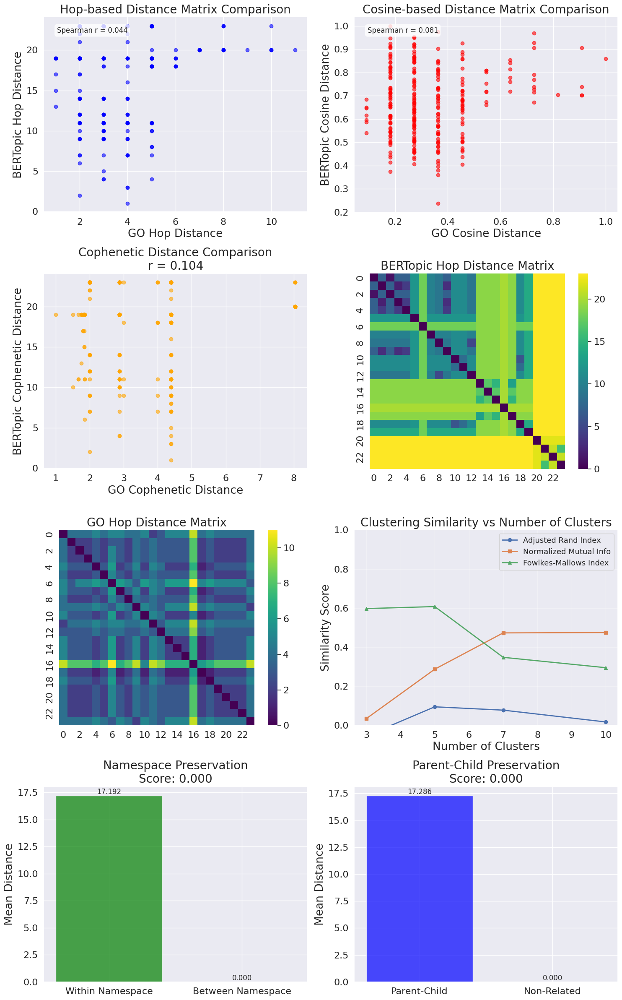

=== GO Hierarchy Comparison Results ===
Comprehensive Score: 0.0651
Score Range: [-1.0, 1.0] (higher is better)

=== Score Components ===
  hop_distance_correlation: 0.0088
  cosine_distance_correlation: 0.0081
  clustering_similarity: 0.0051
  namespace_preservation: 0.0000
  parent_child_preservation: 0.0000
  cophenetic_correlation: 0.0156
  fowlkes_mallows_index: 0.0462
  dendrogram_structure: -0.0500
  subtree_similarity: 0.0312

=== Detailed Metrics with Interpretations ===

--- Distance Correlation Metrics ---
  Hop-based Spearman Correlation: 0.0440 (poor)
    Range: (-1, 1), Spearman correlation measures monotonic relationship between distance matrices
  Cosine-based Spearman Correlation: 0.0811 (poor)
    Range: (-1, 1), Spearman correlation measures monotonic relationship between distance matrices

--- Clustering Similarity Metrics ---
  Average Adjusted Rand Index: 0.0341 (poor)
    Range: (-1, 1), ARI measures similarity between clusterings, adjusted for chance
  Average N

{'comprehensive_score': np.float64(0.06509260794448117),
 'score_components': {'hop_distance_correlation': np.float64(0.008792786721016204),
  'cosine_distance_correlation': np.float64(0.008107929931929105),
  'clustering_similarity': np.float64(0.005115516977958278),
  'namespace_preservation': 0.0,
  'parent_child_preservation': 0.0,
  'cophenetic_correlation': np.float64(0.015609175781874816),
  'fowlkes_mallows_index': np.float64(0.04621719853170278),
  'dendrogram_structure': np.float64(-0.05),
  'subtree_similarity': 0.03125},
 'detailed_metrics': {'distance_metrics_cosine': {'comparison_type': 'cosine-based',
   'spearman_correlation': np.float64(0.08107929931929105),
   'spearman_p_value': np.float64(0.17924300594323722),
   'pearson_correlation': np.float64(0.15252370167486295),
   'pearson_p_value': np.float64(0.011171872079730685),
   'rmse': np.float64(0.3919907443902871),
   'normalized_rmse': np.float64(2.4244700202610128)},
  'distance_metrics_hop': {'comparison_type': '

In [17]:
compare_hierarchies(go_dag, goslim_terms, topic_model, documents)

In [18]:
# --- Comparison of Tokenization Methods ---
# df_train_comp = df_protein_go[df_protein_go['go_aspect'] == 'molecular_function'].reset_index(drop=True).copy()
df_train_comp = df_train.copy()


tokenizer_cols_comp = list(tokenizer_list.keys())
go_col_comp = 'go_name'
token_len_thr_comp = 3
top_n_words_comp = 300
lambda_smooth_comp = 1.6
alpha_comp = 0.5
beta_comp = 0.6
theta_comp = 1.2

df_results = compare_tokenization_methods_hierarchical(
    df_train_comp, tokenizer_cols_comp, go_col_comp, go_dag, goslim_terms,
    vocab_lineage_list, token_len_thr_comp, top_n_words_comp,
    lambda_smooth_comp, alpha_comp, beta_comp, theta_comp
)
display(df_results)

Comparing Tokenizers for Hierarchy:   0%|          | 0/15 [00:00<?, ?it/s]2025-07-09 10:33:49,274 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.



--- Evaluating Hierarchy for Tokenizer: BPE 1600 ---
 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


100%|██████████| 23/23 [00:00<00:00, 784.64it/s]
2025-07-09 10:33:50,375 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.
2025-07-09 10:33:50,619 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.


 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


Comparing Tokenizers for Hierarchy:   7%|▋         | 1/15 [00:02<00:35,  2.51s/it]2025-07-09 10:33:51,789 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.



--- Evaluating Hierarchy for Tokenizer: BPE 3200 ---
 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


100%|██████████| 23/23 [00:00<00:00, 277.81it/s]
2025-07-09 10:33:53,088 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.
2025-07-09 10:33:53,446 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.


 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


Comparing Tokenizers for Hierarchy:  13%|█▎        | 2/15 [00:05<00:36,  2.83s/it]2025-07-09 10:33:54,859 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.



--- Evaluating Hierarchy for Tokenizer: BPE 6400 ---
 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


100%|██████████| 23/23 [00:00<00:00, 211.77it/s]
2025-07-09 10:33:56,375 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.
2025-07-09 10:33:56,851 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.


 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


Comparing Tokenizers for Hierarchy:  20%|██        | 3/15 [00:10<00:43,  3.63s/it]2025-07-09 10:33:59,418 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.



--- Evaluating Hierarchy for Tokenizer: BPE 12800 ---
 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


100%|██████████| 23/23 [00:00<00:00, 153.80it/s]
2025-07-09 10:34:01,135 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.
2025-07-09 10:34:01,704 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.


 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


Comparing Tokenizers for Hierarchy:  27%|██▋       | 4/15 [00:23<01:21,  7.36s/it]2025-07-09 10:34:12,496 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.



--- Evaluating Hierarchy for Tokenizer: BPE 25600 ---
 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


100%|██████████| 23/23 [00:00<00:00, 114.12it/s]
2025-07-09 10:34:14,529 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.
2025-07-09 10:34:15,260 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.


 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


Comparing Tokenizers for Hierarchy:  33%|███▎      | 5/15 [01:15<03:55, 23.56s/it]2025-07-09 10:35:04,809 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.



--- Evaluating Hierarchy for Tokenizer: PUMA blosum62 0.7 0.05 1600 ---
 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


100%|██████████| 23/23 [00:00<00:00, 485.65it/s]
2025-07-09 10:35:05,980 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.
2025-07-09 10:35:06,236 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.


 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


Comparing Tokenizers for Hierarchy:  40%|████      | 6/15 [01:18<02:28, 16.48s/it]2025-07-09 10:35:07,538 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.



--- Evaluating Hierarchy for Tokenizer: PUMA blosum62 0.7 0.05 3200 ---
 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


100%|██████████| 23/23 [00:00<00:00, 252.78it/s]
2025-07-09 10:35:08,891 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.
2025-07-09 10:35:09,257 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.


 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


Comparing Tokenizers for Hierarchy:  47%|████▋     | 7/15 [01:21<01:37, 12.14s/it]2025-07-09 10:35:10,747 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.



--- Evaluating Hierarchy for Tokenizer: PUMA blosum62 0.7 0.05 6400 ---
 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


100%|██████████| 23/23 [00:00<00:00, 213.35it/s]
2025-07-09 10:35:12,268 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.
2025-07-09 10:35:12,766 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.


 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


Comparing Tokenizers for Hierarchy:  53%|█████▎    | 8/15 [01:26<01:08,  9.76s/it]2025-07-09 10:35:15,412 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.



--- Evaluating Hierarchy for Tokenizer: PUMA blosum62 0.7 0.05 12800 ---
 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


100%|██████████| 23/23 [00:00<00:00, 159.36it/s]
2025-07-09 10:35:17,118 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.
2025-07-09 10:35:17,752 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.


 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


Comparing Tokenizers for Hierarchy:  60%|██████    | 9/15 [01:38<01:03, 10.55s/it]2025-07-09 10:35:27,704 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.



--- Evaluating Hierarchy for Tokenizer: PUMA blosum62 0.7 0.05 25600 ---
 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


100%|██████████| 23/23 [00:00<00:00, 121.39it/s]
2025-07-09 10:35:29,684 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.
2025-07-09 10:35:30,575 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.


 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


Comparing Tokenizers for Hierarchy:  67%|██████▋   | 10/15 [02:19<01:39, 19.98s/it]2025-07-09 10:36:08,779 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.



--- Evaluating Hierarchy for Tokenizer: PUMA pre pam70 0.7 0.05 1600 ---
 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


100%|██████████| 23/23 [00:00<00:00, 506.56it/s]
2025-07-09 10:36:09,940 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.
2025-07-09 10:36:10,195 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.


 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


Comparing Tokenizers for Hierarchy:  73%|███████▎  | 11/15 [02:25<01:02, 15.74s/it]2025-07-09 10:36:14,888 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.



--- Evaluating Hierarchy for Tokenizer: PUMA pre pam70 0.7 0.05 3200 ---
 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


100%|██████████| 23/23 [00:00<00:00, 258.42it/s]
2025-07-09 10:36:16,219 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.
2025-07-09 10:36:16,577 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.


 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


Comparing Tokenizers for Hierarchy:  80%|████████  | 12/15 [02:28<00:35, 11.91s/it]2025-07-09 10:36:18,043 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.



--- Evaluating Hierarchy for Tokenizer: PUMA pre pam70 0.7 0.05 6400 ---
 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


100%|██████████| 23/23 [00:00<00:00, 206.07it/s]
2025-07-09 10:36:19,544 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.
2025-07-09 10:36:19,999 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.


 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


Comparing Tokenizers for Hierarchy:  87%|████████▋ | 13/15 [02:33<00:19,  9.68s/it]2025-07-09 10:36:22,576 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.



--- Evaluating Hierarchy for Tokenizer: PUMA pre pam70 0.7 0.05 12800 ---
 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


100%|██████████| 23/23 [00:00<00:00, 162.17it/s]
2025-07-09 10:36:24,295 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.
2025-07-09 10:36:24,897 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.


 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


Comparing Tokenizers for Hierarchy:  93%|█████████▎| 14/15 [02:45<00:10, 10.44s/it]2025-07-09 10:36:34,771 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.



--- Evaluating Hierarchy for Tokenizer: PUMA pre pam70 0.7 0.05 25600 ---
 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


100%|██████████| 23/23 [00:00<00:00, 121.80it/s]
2025-07-09 10:36:36,743 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.
2025-07-09 10:36:37,624 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.


 GoSubDag: 206 sources in 335 GOs rcnt(True). 65 alt GO IDs
 GoSubDag: namedtuple fields: NS level depth GO alt GO_name dcnt D1 id
 GoSubDag: relationships: set()


Comparing Tokenizers for Hierarchy: 100%|██████████| 15/15 [03:27<00:00, 13.81s/it]


,Tokenizer,Model,comprehensive_score,hop_distance_correlation,cosine_distance_correlation,clustering_similarity,namespace_preservation,parent_child_preservation,cophenetic_correlation,fowlkes_mallows_index,dendrogram_structure,subtree_similarity
0,BPE 1600,Standard BERTopic,0.043301,0.020628,-0.001839,0.001785,0.0,0.0,0.018582,0.031873,-0.049951,0.022222
1,BPE 1600,Graph-Aware BERTopic,0.047179,0.007271,-0.000155,0.009577,0.0,0.0,0.019724,0.035713,-0.049951,0.025000
2,BPE 3200,Standard BERTopic,0.083110,0.013344,0.009408,0.004077,0.0,0.0,0.022250,0.048317,-0.050000,0.035714
3,BPE 3200,Graph-Aware BERTopic,0.078341,0.013162,0.009439,0.004077,0.0,0.0,0.022096,0.048317,-0.050000,0.031250
4,BPE 6400,Standard BERTopic,0.080415,0.012020,0.009053,0.004077,0.0,0.0,0.021234,0.048317,-0.050000,0.035714
5,BPE 6400,Graph-Aware BERTopic,0.080482,0.012020,0.009120,0.004077,0.0,0.0,0.021234,0.048317,-0.050000,0.035714
6,BPE 12800,Standard BERTopic,0.064402,0.008422,0.009347,0.003319,0.0,0.0,0.016012,0.046052,-0.050000,0.031250
7,BPE 12800,Graph-Aware BERTopic,0.064595,0.008422,0.009540,0.003319,0.0,0.0,0.016012,0.046052,-0.050000,0.031250
8,BPE 25600,Standard BERTopic,0.059515,0.007707,0.009193,0.001542,0.0,0.0,0.014941,0.044882,-0.050000,0.031250
9,BPE 25600,Graph-Aware BERTopic,0.059490,0.007707,0.009168,0.001542,0.0,0.0,0.014941,0.044882,-0.050000,0.031250


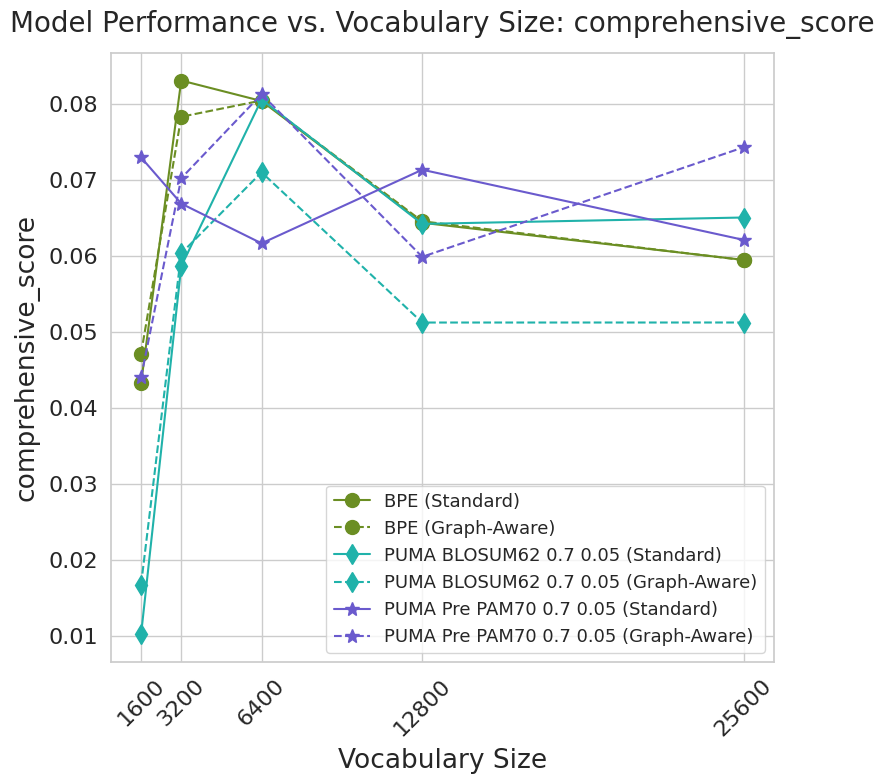

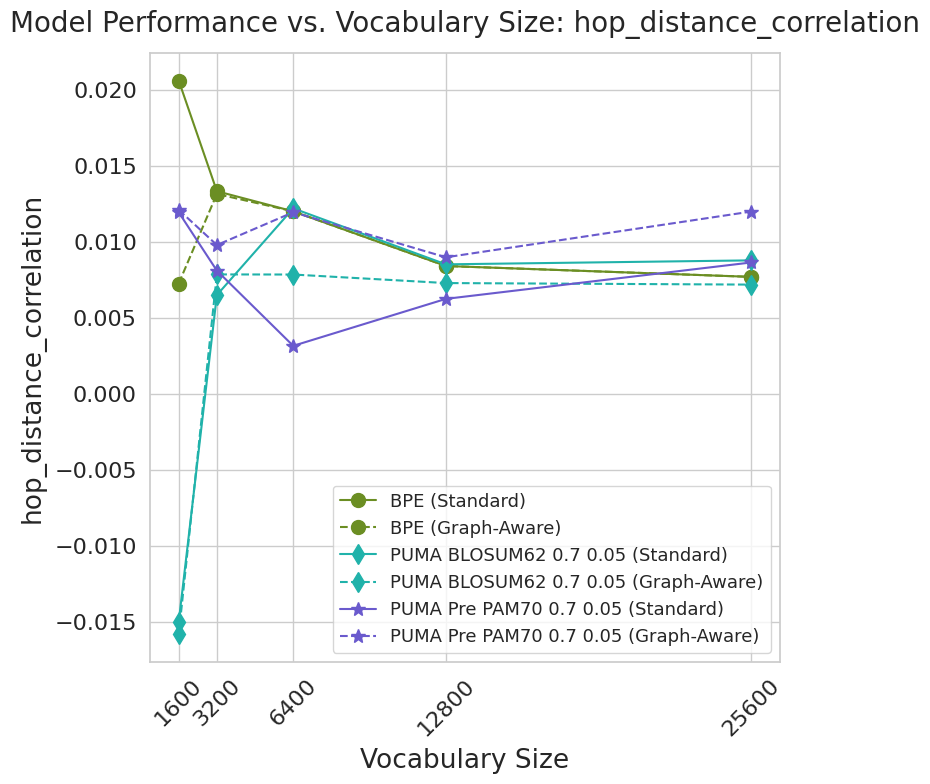

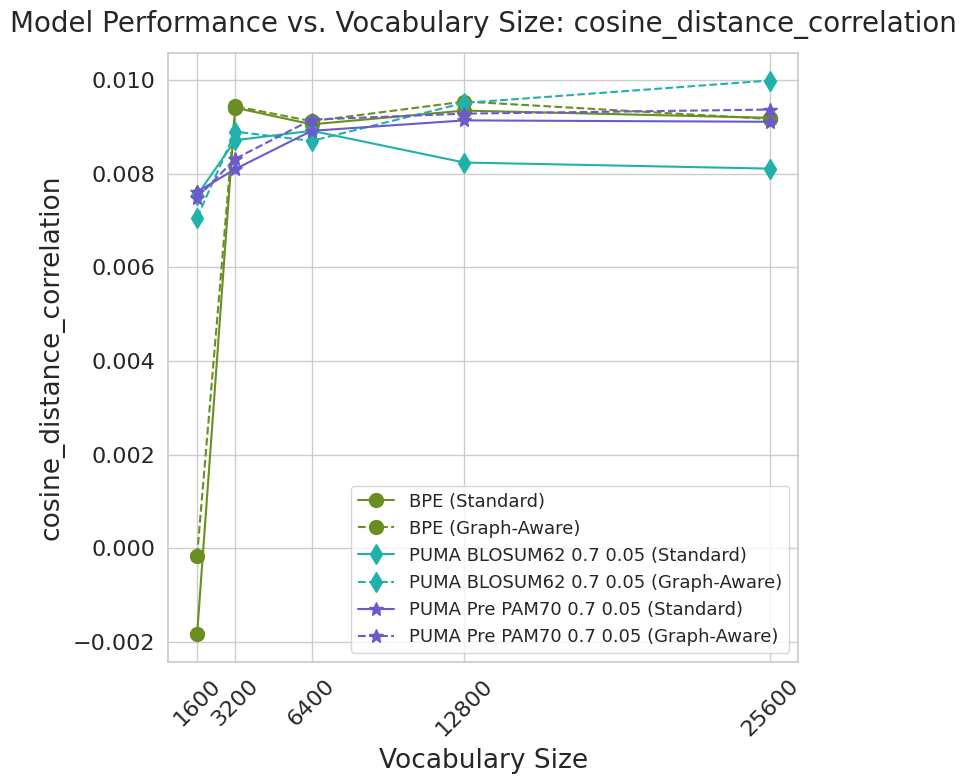

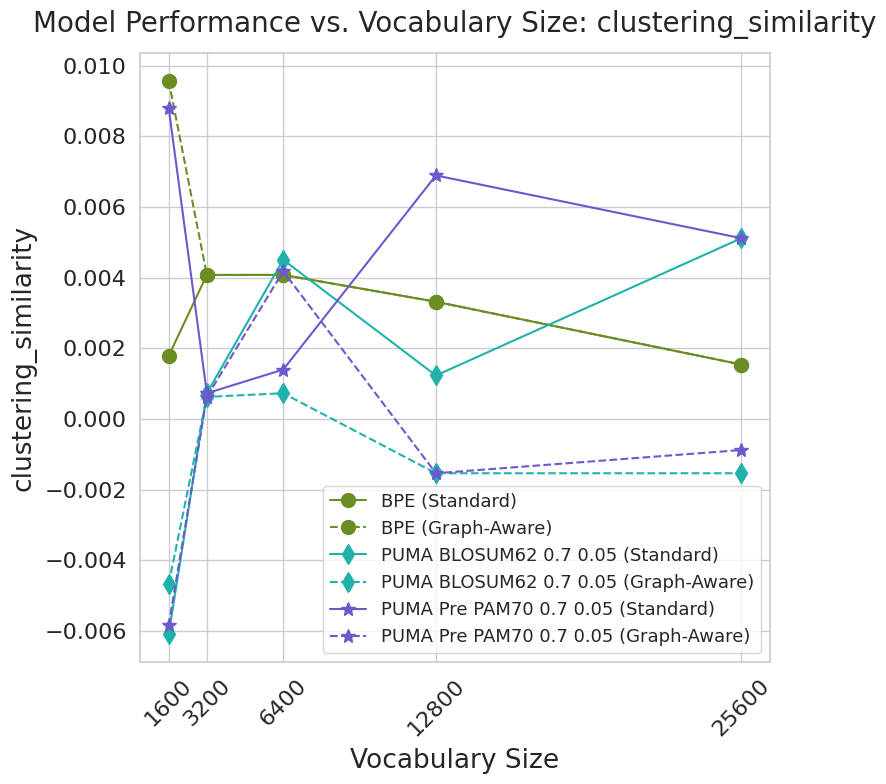

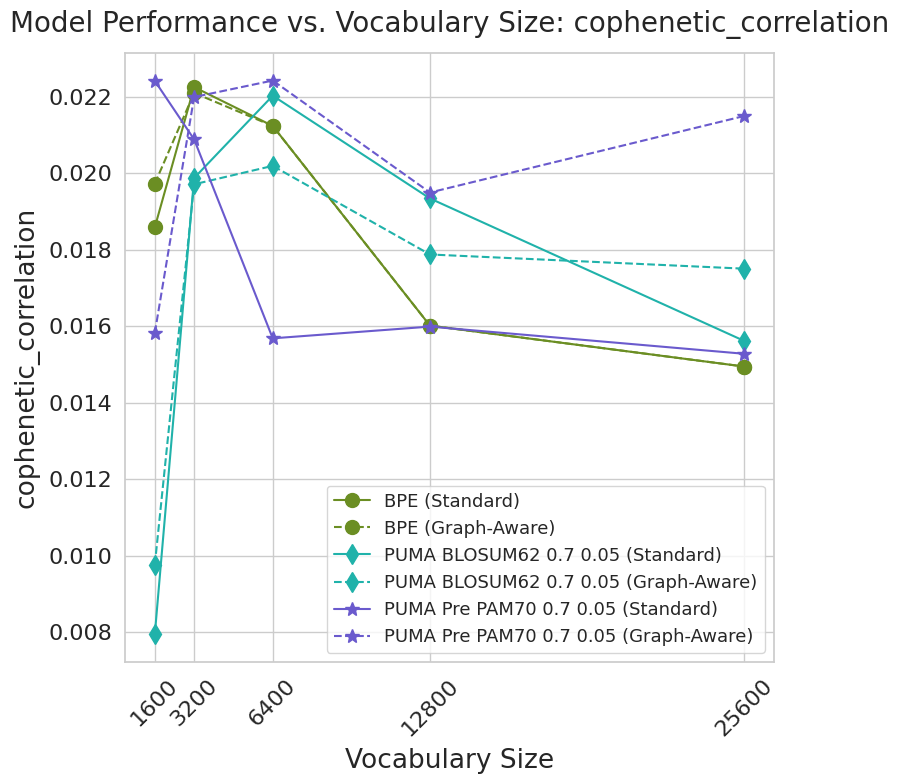

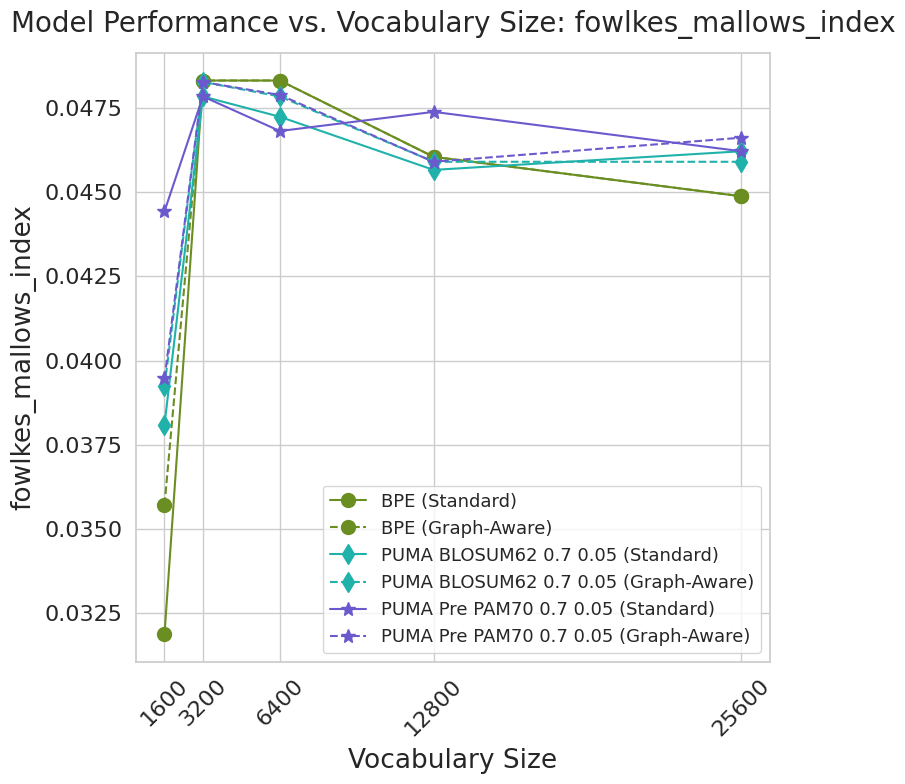

In [19]:
visualize_comparison_results(df_results[['Tokenizer', 'Model', 'comprehensive_score', 'hop_distance_correlation', 'cosine_distance_correlation', 'clustering_similarity', 'cophenetic_correlation', 'fowlkes_mallows_index']], 
                             methods, methods2names, vocab_sizes)